# Setup - Requires a docker container yuh
```bash
sudo docker run --device=nvidia.com/gpu=all \
                                                      -p 51000:51000 \
                                                      --shm-size 2g \
                                                      -e CLIP_MODEL_NAME=jinaai/jina-clip-v2 \
                                                      -v ~/.cache/huggingface:/root/.cache/huggingface \
                                                      jinaai/clip-server:latest
                                                      
```

In [19]:
import nest_asyncio
nest_asyncio.apply()

from clip_client import Client

# Using the IP found in your server logs
c = Client('grpc://172.17.0.8:51000') 

c.profile()

Roundtrip  6ms  100% 
├──  Client-server network  4ms  65% 
└──  Server  2ms  35% 
    ├──  Gateway-CLIP network  0ms  0% 
    └──  CLIP model  2ms  100%

{'Roundtrip': 5.666141001711367,
 'Client-server network': 3.6661410017113667,
 'Server': 2,
 'Gateway-CLIP network': 0,
 'CLIP model': 2}

In [6]:
import os
import glob
from docarray import Document, DocumentArray
# 2. Find all images in the directory
image_dir = os.path.expanduser('~/workspace/Datasets/Pictures/')
# Add any other extensions you have (e.g., .png, .jpeg)
image_paths = glob.glob(os.path.join(image_dir, '*')) 

# Filter to ensure we only try to open images
valid_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.gif', '.webp'}
image_paths = [p for p in image_paths if os.path.splitext(p)[1].lower() in valid_extensions]

print(f"Found {len(image_paths)} images in {image_dir}")


📂 Found 758 images in /home/jovyan/workspace/Datasets/Pictures/


In [7]:
docs = DocumentArray([Document(uri=path) for path in image_paths])

def data_generator(docs):
    for doc in docs:
        try:
            # IMPORTANT: This loads the file content so it can be sent 
            # across the container boundary to the server.
            doc.load_uri_to_blob() 
            yield doc
        except Exception as e:
            print(f"Could not load {doc.uri}: {e}")

In [9]:
print(f"Sending {len(docs)} images to CLIP server...")

# batch_size=16 is a safe number to prevent timeouts or OOM on the GPU
embeddings = c.encode(
    data_generator(docs), 
    batch_size=16, 
    show_progress=True
)

print(f"Finished! Embeddings Shape: {embeddings.embeddings.shape}")

Output()

Sending 758 images to CLIP server...


Finished! Embeddings Shape: (758, 512)


🚀 Encoding 10 control images...

🔎 QUERY: 41727336_001_20fe.jpg
📊 Debug Data (Top Matches):
[ { 'filename': '19652267_001_37b3.jpg',
    'score': np.float32(0.1468),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/19652267_001_37b3.jpg'},
  { 'filename': '19652267_002_5cdc.jpg',
    'score': np.float32(0.1501),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/19652267_002_5cdc.jpg'},
  { 'filename': '12949502_047_63e1.jpg',
    'score': np.float32(0.1836),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/12949502_047_63e1.jpg'},
  { 'filename': '50895153_300_65f6.jpg',
    'score': np.float32(0.1871),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/50895153_300_65f6.jpg'},
  { 'filename': '41727336_005_2efd.jpg',
    'score': np.float32(0.1881),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/41727336_005_2efd.jpg'}]


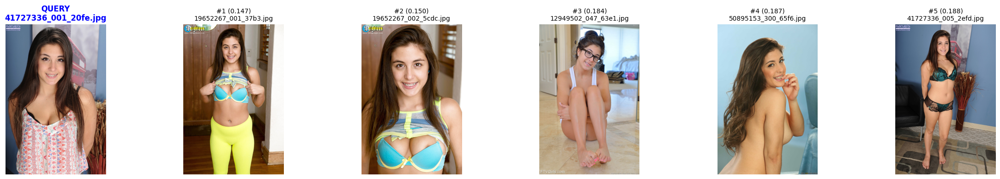


🔎 QUERY: 51901322_003_9a63.jpg
📊 Debug Data (Top Matches):
[ { 'filename': '51901322_008_d9cc.jpg',
    'score': np.float32(0.0791),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/51901322_008_d9cc.jpg'},
  { 'filename': '51901322_031_b608.jpg',
    'score': np.float32(0.0825),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/51901322_031_b608.jpg'},
  { 'filename': '33011273_009_7897.jpg',
    'score': np.float32(0.1225),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/33011273_009_7897.jpg'},
  { 'filename': '80274499_001_e6c3.jpg',
    'score': np.float32(0.1491),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/80274499_001_e6c3.jpg'},
  { 'filename': '1762988761059193.jpg',
    'score': np.float32(0.1848),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1762988761059193.jpg'}]


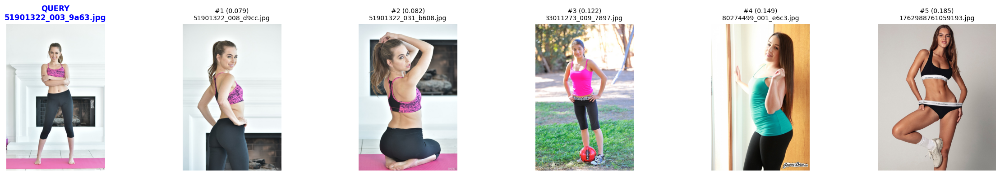


🔎 QUERY: 1761545212565880.jpg
📊 Debug Data (Top Matches):
[ { 'filename': '11349024_002_c9cd.jpg',
    'score': np.float32(0.2649),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/11349024_002_c9cd.jpg'},
  { 'filename': '1762265071900593.jpg',
    'score': np.float32(0.2744),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1762265071900593.jpg'},
  { 'filename': '1762204339340031.png',
    'score': np.float32(0.2758),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1762204339340031.png'},
  { 'filename': '11349024_001_8915.jpg',
    'score': np.float32(0.2806),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/11349024_001_8915.jpg'},
  { 'filename': '1761836084460536.jpg',
    'score': np.float32(0.2944),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1761836084460536.jpg'}]


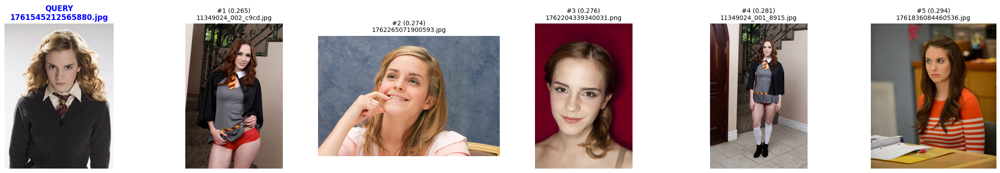


🔎 QUERY: 1762818149770738.jpg
📊 Debug Data (Top Matches):
[ { 'filename': '1762621047151416.jpg',
    'score': np.float32(0.1519),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1762621047151416.jpg'},
  { 'filename': '1762055362026260.png',
    'score': np.float32(0.1666),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1762055362026260.png'},
  { 'filename': '1762048105105982.png',
    'score': np.float32(0.1666),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1762048105105982.png'},
  { 'filename': '1762026767282629.jpg',
    'score': np.float32(0.1762),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1762026767282629.jpg'},
  { 'filename': '1763564685588295.jpg',
    'score': np.float32(0.1912),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1763564685588295.jpg'}]


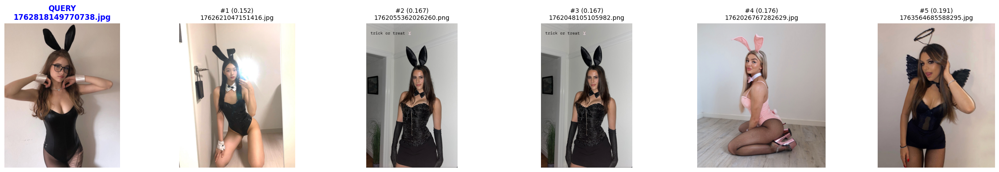


🔎 QUERY: 1762017861698007.jpg
📊 Debug Data (Top Matches):
[ { 'filename': '73969611_007_a8b2.jpg',
    'score': np.float32(0.1955),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/73969611_007_a8b2.jpg'},
  { 'filename': '1762044527488343.jpg',
    'score': np.float32(0.2167),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1762044527488343.jpg'},
  { 'filename': '1762992387545621.png',
    'score': np.float32(0.2367),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1762992387545621.png'},
  { 'filename': '1761919370552982.jpg',
    'score': np.float32(0.2416),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1761919370552982.jpg'},
  { 'filename': '1762014698345826.jpg',
    'score': np.float32(0.2424),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1762014698345826.jpg'}]


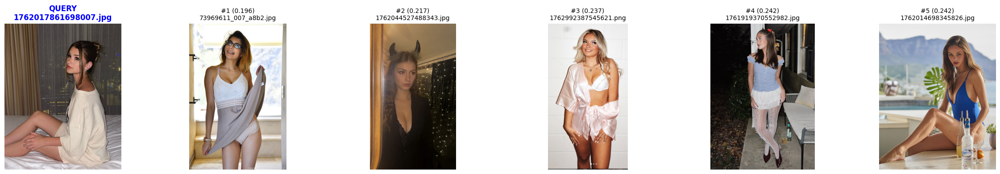


🔎 QUERY: d4987cb47ceabcdee549de472dd6e545.jpg
📊 Debug Data (Top Matches):
[ { 'filename': '1762988761059193.jpg',
    'score': np.float32(0.2098),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1762988761059193.jpg'},
  { 'filename': '1762171772955454.jpg',
    'score': np.float32(0.2175),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1762171772955454.jpg'},
  { 'filename': '1762034467358242.jpg',
    'score': np.float32(0.2192),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1762034467358242.jpg'},
  { 'filename': '1762657735556626.jpg',
    'score': np.float32(0.2335),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1762657735556626.jpg'},
  { 'filename': '1761906891910605.jpg',
    'score': np.float32(0.2383),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1761906891910605.jpg'}]


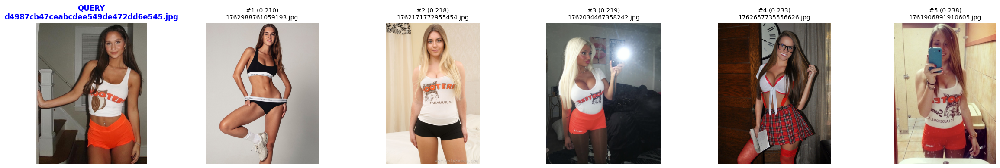


🔎 QUERY: 471187088_10161415512427606_5252195410000689832_n.jpg
📊 Debug Data (Top Matches):
[ { 'filename': '5e263275d16aaa094c97bbd5fbd6d186.jpeg',
    'score': np.float32(0.1253),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/5e263275d16aaa094c97bbd5fbd6d186.jpeg'},
  { 'filename': 'tumblr_npu24euCMM1txqdrdo1_640.jpg',
    'score': np.float32(0.1475),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/tumblr_npu24euCMM1txqdrdo1_640.jpg'},
  { 'filename': 'images.jpg',
    'score': np.float32(0.1579),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/images.jpg'},
  { 'filename': '497570495_3885777621634929_3958644058030490689_n.jpg',
    'score': np.float32(0.1603),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/497570495_3885777621634929_3958644058030490689_n.jpg'},
  { 'filename': 'brooke-wexler_1286609.jpg',
    'score': np.float32(0.171),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/brooke-wexler_1286609.jpg'}]


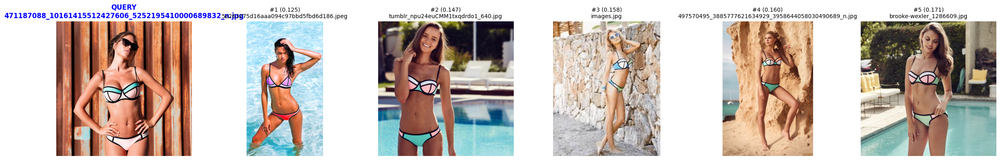


🔎 QUERY: 1763571919384294.jpg
📊 Debug Data (Top Matches):
[ { 'filename': 'little-ari-random-pics-v0-m29qu9nzxh1g1.webp',
    'score': np.float32(0.2049),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/little-ari-random-pics-v0-m29qu9nzxh1g1.webp'},
  { 'filename': 'little-ari-random-pics-v0-lcoqb9nzxh1g1.webp',
    'score': np.float32(0.2281),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/little-ari-random-pics-v0-lcoqb9nzxh1g1.webp'},
  { 'filename': 'little-ari-random-pics-v0-tr5ecbnzxh1g1.webp',
    'score': np.float32(0.2367),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/little-ari-random-pics-v0-tr5ecbnzxh1g1.webp'},
  { 'filename': 'little-ari-random-pics-v0-tds94anzxh1g1.webp',
    'score': np.float32(0.2519),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/little-ari-random-pics-v0-tds94anzxh1g1.webp'},
  { 'filename': '1763579468555249.jpg',
    'score': np.float32(0.2579),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1763579468555249.jpg'}]

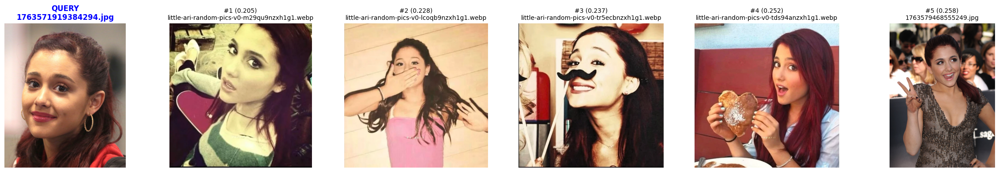


🔎 QUERY: 1763557852478772.png
📊 Debug Data (Top Matches):
[ { 'filename': '75043554_014_6181.jpg',
    'score': np.float32(0.3042),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/75043554_014_6181.jpg'},
  { 'filename': 'aerith-gainsborough-by-me-v0-tb860nx6zs1g1.webp',
    'score': np.float32(0.3256),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/aerith-gainsborough-by-me-v0-tb860nx6zs1g1.webp'},
  { 'filename': '1763561394951419.jpg',
    'score': np.float32(0.3257),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1763561394951419.jpg'},
  { 'filename': '1763562209714919.jpg',
    'score': np.float32(0.3373),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/1763562209714919.jpg'},
  { 'filename': 'little-ari-random-pics-v0-o17dg9nzxh1g1.webp',
    'score': np.float32(0.3406),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/little-ari-random-pics-v0-o17dg9nzxh1g1.webp'}]


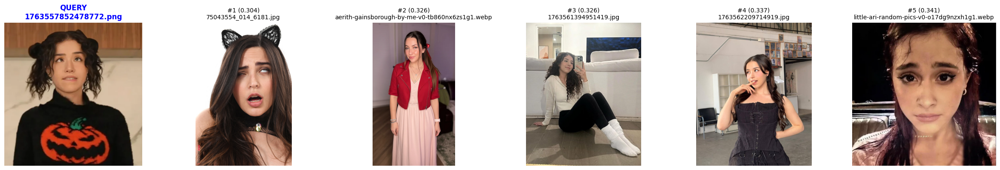


🔎 QUERY: 2008-taylor-swift-tour-v0-whcs3m73r31g1.webp
📊 Debug Data (Top Matches):
[ { 'filename': '2008-taylor-swift-tour-v0-345u2a23r31g1.webp',
    'score': np.float32(0.1433),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/2008-taylor-swift-tour-v0-345u2a23r31g1.webp'},
  { 'filename': 'taylors-award-show-performance-outfits-through-the-years-v0-6au8emsbzn1g1.webp',
    'score': np.float32(0.2258),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/taylors-award-show-performance-outfits-through-the-years-v0-6au8emsbzn1g1.webp'},
  { 'filename': '2008-taylor-swift-tour-v0-trxi2lb3r31g1.webp',
    'score': np.float32(0.2297),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/2008-taylor-swift-tour-v0-trxi2lb3r31g1.webp'},
  { 'filename': '2008-taylor-swift-tour-v0-39cv8n53r31g1.webp',
    'score': np.float32(0.2408),
    'uri': '/home/jovyan/workspace/Datasets/Pictures/2008-taylor-swift-tour-v0-39cv8n53r31g1.webp'},
  { 'filename': '1762807105085339.jpg',
    'score': np.f

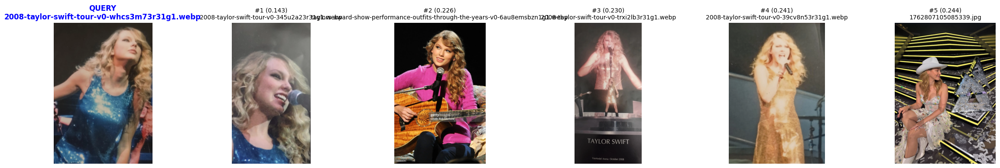

In [20]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from docarray import Document, DocumentArray
import pprint

# --- Configuration ---
# Set how many matches you want to see (excluding the self-match)
TOP_K = 5 

# 1. Load and Encode Control Images
control_dir = os.path.expanduser('~/workspace/Datasets/Pictures/Control/')
control_files = [f for f in os.listdir(control_dir) if not f.startswith('.')]
control_docs = DocumentArray([
    Document(uri=os.path.join(control_dir, f)) for f in control_files
])

# Load blobs for encoding
for d in control_docs:
    d.load_uri_to_blob()

print(f"🚀 Encoding {len(control_docs)} control images...")
control_encoded = c.encode(control_docs)

# 2. Match against the main dataset
# We ask for TOP_K + 1 because we expect the first match to be the image itself
control_encoded.match(embeddings, limit=TOP_K + 1)

# 3. Pretty Print & Visualize
for query_doc in control_encoded:
    query_name = os.path.basename(query_doc.uri)
    
    # --- Filter out "Self" matches ---
    # We keep matches only if the score is somewhat less than 1.0 (e.g. < 0.9999)
    # OR if the filename is different.
    real_matches = []
    for m in query_doc.matches:
        match_name = os.path.basename(m.uri)
        # Check if it's effectively the same image
        if match_name != query_name and m.scores['cosine'].value < 0.99999:
            real_matches.append(m)
    
    # Trim to the number of results we actually want
    real_matches = real_matches[:TOP_K]

    # --- Text Output (Debug Data) ---
    print(f"\n{'='*60}")
    print(f"🔎 QUERY: {query_name}")
    print(f"{'='*60}")
    
    debug_data = []
    for m in real_matches:
        debug_data.append({
            "score": round(m.scores['cosine'].value, 4),
            "filename": os.path.basename(m.uri),
            "uri": m.uri
        })
    
    print("📊 Debug Data (Top Matches):")
    pprint.pprint(debug_data, indent=2, width=60)

    # --- Visual Output (Matplotlib) ---
    # Create a figure: 1 row, (1 query + N matches) columns
    cols = len(real_matches) + 1
    fig, axes = plt.subplots(1, cols, figsize=(4 * cols, 4))
    
    # 1. Plot Query Image
    if cols == 1: axes = [axes] # Handle edge case if single plot
    
    try:
        img_query = mpimg.imread(query_doc.uri)
        axes[0].imshow(img_query)
        axes[0].set_title(f"QUERY\n{query_name}", color='blue', fontsize=12, fontweight='bold')
        axes[0].axis('off')
    except Exception as e:
        axes[0].text(0.5, 0.5, f"Image Error\n{e}", ha='center')

    # 2. Plot Result Images
    for i, match in enumerate(real_matches):
        ax = axes[i+1]
        try:
            img_match = mpimg.imread(match.uri)
            ax.imshow(img_match)
            score = match.scores['cosine'].value
            fname = os.path.basename(match.uri)
            
            # Green title for high similarity, black for lower
            color = 'green' if score > 0.85 else 'black'
            ax.set_title(f"#{i+1} ({score:.3f})\n{fname}", color=color, fontsize=10)
            ax.axis('off')
        except Exception as e:
            ax.text(0.5, 0.5, "Image Error", ha='center')
            
    plt.tight_layout()
    plt.show()